In [3]:
from PIL import Image
import numpy as np


In [48]:
def load_image(image_path):
    image = Image.open(image_path)
    image = image.convert('RGB')
    image = np.array(image) / 255.0  # Normalize RGB values to [0, 1]
    return image


In [64]:
def display_image(imageMatrix, scale=1):
    imageMatrix = (imageMatrix * 255).astype(np.uint8)
    image = Image.fromarray(imageMatrix)
    display(image.resize((image.width * scale, image.height * scale)))


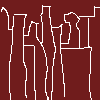

In [52]:
image = load_image('images/city.png')
display_image(image)

In [73]:
import numpy as np

def compute_retarded_time(x, y, v, L, max_iter=10):
    """
    Vectorized version.
    
    Solve for the retarded time t_r that satisfies:
        t_r + sqrt((x + v*t_r)**2 + y**2 + L**2) = 0.
        
    Parameters:
      x, y : NumPy arrays of the same shape representing the physical x and y coordinates.
      v    : Speed (fraction of c).
      L    : Observer distance.
      max_iter : Number of iterations for Newton's method.
      
    Returns:
      t    : Array of retarded times (same shape as x and y).
    """
    # Initial guess: for v=0.
    t = -np.sqrt(x**2 + y**2 + L**2)
    for _ in range(max_iter):
        denom = np.sqrt((x + v * t)**2 + y**2 + L**2)
        f_val = t + denom
        f_deriv = 1 + (v * (x + v * t)) / denom
        t = t - f_val / f_deriv
    return t

def compute_projected_coordinates(x, y, v, t_r, L, f):
    """
    Vectorized version.
    
    Using the retarded time, compute the observed (warped) coordinates.
    
    Parameters:
      x, y : Arrays of physical coordinates.
      v    : Speed (fraction of c).
      t_r  : Array of retarded times (same shape as x and y).
      L    : Observer distance.
      f    : Focal length used for perspective projection.
      
    Returns:
      u, w : Arrays of projected coordinates on the observer's image plane.
      X, Y : Arrays for the emission point coordinates.
    """
    X = x + v * t_r  # Warped x coordinate.
    Y = y            # y remains unchanged.
    u = X * f / L
    w = Y * f / L
    return u, w, X, Y

def compute_doppler_shift(X, Y, L, v):
    """
    Vectorized version.
    
    Calculate the Doppler shift factor for light coming from (X, Y, 0).
    
    Parameters:
      X, Y : Arrays representing the emission point coordinates.
      L    : Observer distance.
      v    : Speed (fraction of c).
      
    Returns:
      doppler : Array of Doppler factors.
    """
    r = np.sqrt(X**2 + Y**2 + L**2)
    cos_theta = X / r  # Motion is along x.
    doppler = np.sqrt((1 + v * cos_theta) / (1 - v * cos_theta))
    return doppler

def adjust_color(image, doppler):
    """
    Vectorized version.
    
    Adjust the RGB colors based on the Doppler factor.
    Red is decreased (red-shifted) and blue is increased (blue-shifted) heuristically.
    
    Parameters:
      image   : Input image array of shape (H, W, 3) with values in [0,1].
      doppler : Array of Doppler factors with shape (H, W).
      
    Returns:
      new_image : Color-adjusted image array of shape (H, W, 3).
    """
    new_image = np.empty_like(image)
    new_image[..., 0] = np.clip(image[..., 0] / doppler, 0, 1)  # Red channel
    new_image[..., 1] = image[..., 1]                             # Green channel unchanged
    new_image[..., 2] = np.clip(image[..., 2] * doppler, 0, 1)    # Blue channel
    return new_image

def relativistic_transform(image, v=0.75, L=10.0, width_phys=2.0, height_phys=2.0, f=1.0):
    """
    Vectorized relativistic transformation.
    
    This function applies a simplified relativistic transformation to an image.
    
    Parameters:
      image      : Input image as a (H, W, 3) NumPy array with values in [0,1].
      v          : Speed of the object (as a fraction of c).
      L          : Observer distance (distance from observer to image plane).
      width_phys : Physical width of the image plane.
      height_phys: Physical height of the image plane.
      f          : Focal length for perspective projection.
      
    Returns:
      out_image  : Transformed image (same resolution as input).
      ranges     : Tuple (u_min, u_max, w_min, w_max) for the computed projected coordinates.
    """
    H, W, _ = image.shape

    # Create physical coordinate grids.
    xs = np.linspace(-width_phys / 2, width_phys / 2, W)
    ys = np.linspace(-height_phys / 2, height_phys / 2, H)
    x_grid, y_grid = np.meshgrid(xs, ys)

    # 1. Compute retarded time (vectorized).
    t_r = compute_retarded_time(x_grid, y_grid, v, L, max_iter=10)
    
    # 2. Compute projected coordinates (vectorized).
    u, w, X, Y = compute_projected_coordinates(x_grid, y_grid, v, t_r, L, f)
    
    # 3. Compute the Doppler shift factor (vectorized).
    doppler = compute_doppler_shift(X, Y, L, v)
    
    # 4. Adjust the pixel colors (vectorized).
    new_image = adjust_color(image, doppler)
    
    # 5. Remap computed continuous coordinates (u, w) to output pixel grid.
    u_min, u_max = u.min(), u.max()
    w_min, w_max = w.min(), w.max()
    j_out = ((u - u_min) / (u_max - u_min) * (W - 1)).astype(np.int32)
    i_out = ((w - w_min) / (w_max - w_min) * (H - 1)).astype(np.int32)
    
    # Flatten the indices and colors.
    flat_indices = (i_out.ravel() * W) + j_out.ravel()
    flat_colors = new_image.reshape(-1, 3)
    num_pixels = H * W

    # Accumulate contributions using np.bincount.
    out_image_vec = np.zeros((num_pixels, 3), dtype=np.float32)
    for channel in range(3):
        out_image_vec[:, channel] = np.bincount(flat_indices,
                                                 weights=flat_colors[:, channel],
                                                 minlength=num_pixels)
    count = np.bincount(flat_indices, minlength=num_pixels)
    
    out_image = out_image_vec.reshape(H, W, 3)
    count = count.reshape(H, W)
    
    # Average contributions where multiple pixels map to the same output pixel.
    mask = count > 0
    out_image[mask] /= count[mask, None]
    
    return out_image, (u_min, u_max, w_min, w_max)


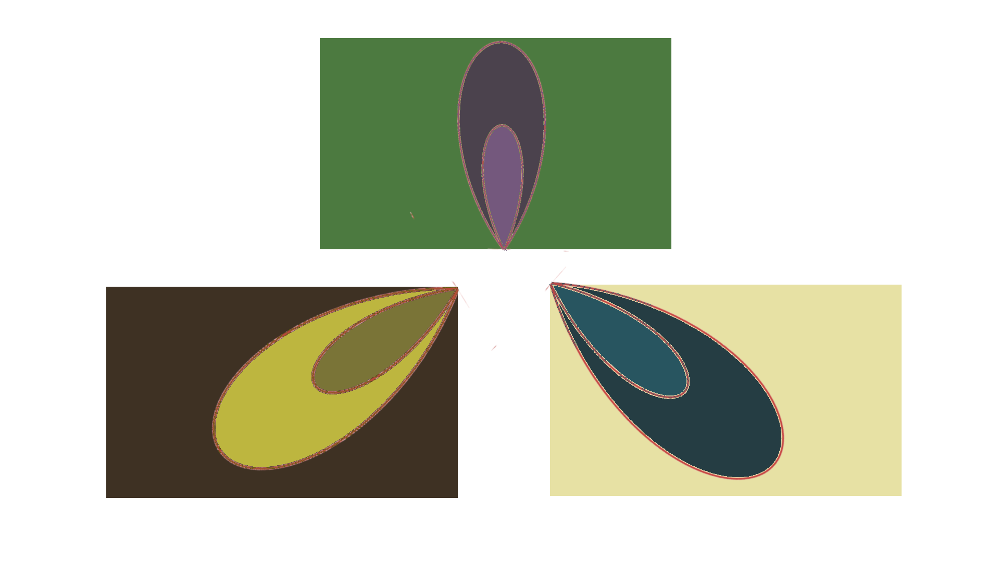

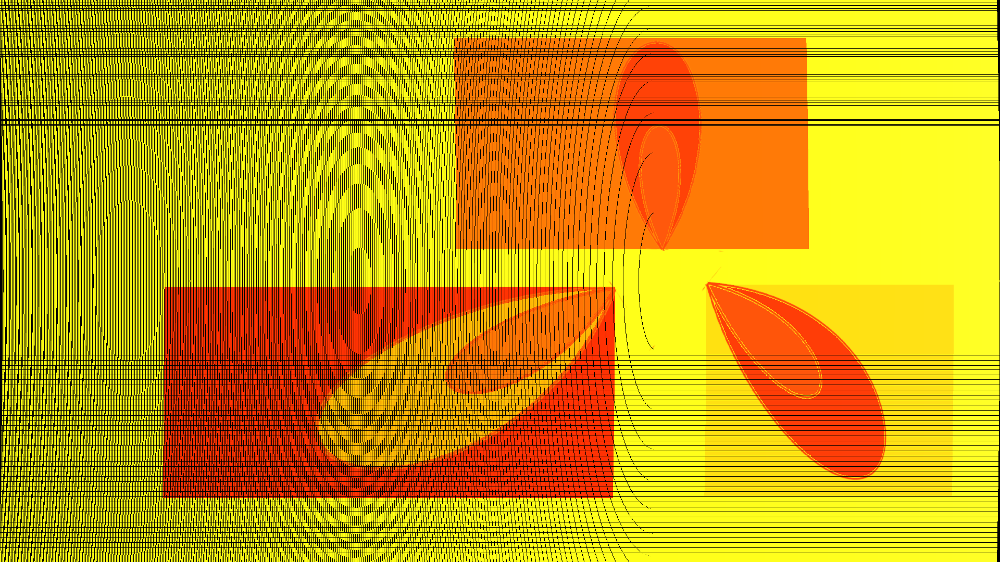

In [74]:
img = load_image("images/Untitled.png")

# Set parameters: v (fraction of c), observer distance L, etc.
params = {
    "v": 0.99, # 75% of the speed of light
    "L": 20.0, # Observer distance from the image plane
    "width_phys": 4.0, # Physical width of the image plane
    "height_phys": 4.0, # Physical height of the image plane

}


# Apply the relativistic transformation.
transformed, ranges = relativistic_transform(img, **params)
display_image(img,scale=3)
display_image(transformed, scale=3)